In [1]:
## we will use opendata set python library to download kaggle datasets

!pip install opendatasets

In [2]:
import opendatasets as od
dataset_url = 'https://www.kaggle.com/datasets/splcher/animefacedataset'
od.download(dataset_url)

Dataset URL: https://www.kaggle.com/datasets/splcher/animefacedataset


In [3]:
import torch
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.transforms import v2

In [4]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils
import os


In [5]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [6]:
transform = v2.Compose(
    [   v2.Resize(size = (64,64)),
        v2.CenterCrop(size=(64,64)),
        v2.ToImage(),
        v2.ToDtype(torch.float32, scale = True),
        v2.Normalize(mean = (0.5,0.5,0.5), std=(0.5,0.5,0.5))

    ]
)

In [7]:
train_dataset = ImageFolder(
    root = '/content/animefacedataset',
    transform = transform
)

In [8]:
# Dataloder outputs 4 dimentional tensor
# [batch, channel, height, wridth] CHW->> HWC
train_loader = DataLoader(
    dataset = train_dataset,
    batch_size = 64,
    num_workers = 2,
    shuffle = True
)


torch.Size([64, 64, 3])


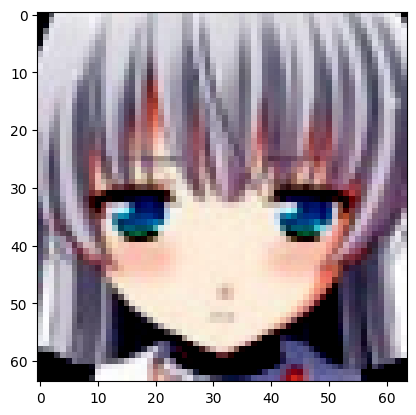

In [9]:
img, label = next(iter(train_loader))
# transposed image for matplotlib
img_transposed = img[0].permute(1,2,0)
print(img_transposed.shape)

import matplotlib.pyplot as plt
plt.imshow(img_transposed)
plt.show()

# Discriminator

In [10]:
import torch.nn as nn

class Discriminator(nn.Module):
  def __init__(self,in_channels = 3):
    super(Discriminator, self).__init__()
    self.model = nn.Sequential(
        nn.Conv2d(in_channels, 64, kernel_size= 4, stride= 2, padding = 1, bias = False),
        nn.BatchNorm2d(64),
        nn.LeakyReLU(0.2, inplace = True),

        nn.Conv2d(64, 128, kernel_size= 4, stride= 2, padding = 1, bias = False),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2, inplace = True),

        nn.Conv2d(128,256, kernel_size= 4, stride= 2, padding = 1, bias = False),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2, inplace = True),


        nn.Conv2d(256, 512, kernel_size= 4, stride= 2, padding = 1, bias = False),
        nn.BatchNorm2d(512),
        nn.LeakyReLU(0.2, inplace = True),

        nn.Conv2d(512, 1, kernel_size= 4, stride= 1, padding = 0, bias = False),
        nn.Flatten(),
        # nn.Sigmoid()

    )

  def forward(self,x):
    return self.model(x)


In [11]:
model_discriminator = Discriminator().to(device)
model_discriminator

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.2, inplace=True)
    (9): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.2, inplace=True)
    (12): Conv2d(512, 1, kernel_size=

In [12]:
for par in model_discriminator.parameters():
  print(par)

Parameter containing:
tensor([[[[ 0.1341, -0.1382, -0.0360,  0.1281],
          [-0.0133, -0.0515,  0.0534,  0.1114],
          [ 0.0201,  0.0231,  0.0221, -0.1027],
          [ 0.0063, -0.1160,  0.0254, -0.1441]],

         [[ 0.0803, -0.0971,  0.1189,  0.0728],
          [-0.0376,  0.0244, -0.1331, -0.0333],
          [ 0.0186, -0.0215,  0.0461,  0.0623],
          [ 0.0679, -0.0648, -0.1279,  0.0285]],

         [[ 0.1304,  0.0258,  0.0892,  0.0987],
          [ 0.0195, -0.0226,  0.1359,  0.0527],
          [ 0.0949, -0.1173, -0.1325,  0.0519],
          [ 0.0319, -0.1005,  0.0425, -0.0148]]],


        [[[ 0.0372, -0.0636, -0.0083, -0.1072],
          [-0.0783, -0.0821,  0.0233,  0.0308],
          [-0.1115,  0.1027,  0.0006,  0.0292],
          [ 0.0223, -0.0997, -0.0931, -0.0096]],

         [[-0.1216,  0.0163,  0.0352, -0.0657],
          [ 0.0240,  0.0056, -0.0217, -0.1269],
          [-0.0325,  0.1152, -0.0905,  0.0227],
          [-0.0929, -0.0583, -0.1066,  0.1012]],

      

# Generator

In [13]:

class Generator(nn.Module):
  def __init__(self, latent_vector = 128):
    super(Generator, self).__init__()
    self.Model = nn.Sequential(

        nn.ConvTranspose2d(latent_vector, 512, kernel_size= 4, stride= 1, padding = 0, bias = False),
        nn.BatchNorm2d(512),
        nn.ReLU(inplace = True),

        nn.ConvTranspose2d(512, 256, kernel_size= 4, stride= 2, padding = 1, bias = False),
        nn.BatchNorm2d(256),
        nn.ReLU(inplace = True),

        nn.ConvTranspose2d(256, 128, kernel_size= 4, stride= 2, padding = 1, bias = False),
        nn.BatchNorm2d(128),
        nn.ReLU(inplace = True),

        nn.ConvTranspose2d(128, 64, kernel_size= 4, stride= 2, padding = 1, bias = False),
        nn.BatchNorm2d(64),
        nn.ReLU(inplace = True),

        nn.ConvTranspose2d(64, 3, kernel_size= 4, stride= 2, padding = 1, bias = False),
        nn.Tanh()

    )
  def forward(self, x):
    return self.Model(x)

In [14]:
model_generator = Generator().to(device)
model_generator

Generator(
  (Model): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)

# Fake inmage Data

In [15]:
from torchvision.utils import make_grid

torch.Size([128, 128, 1, 1])


torch.Size([128, 3, 64, 64])


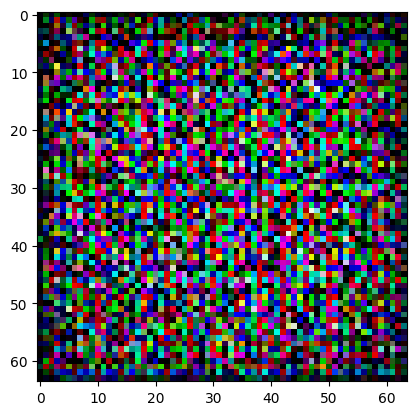

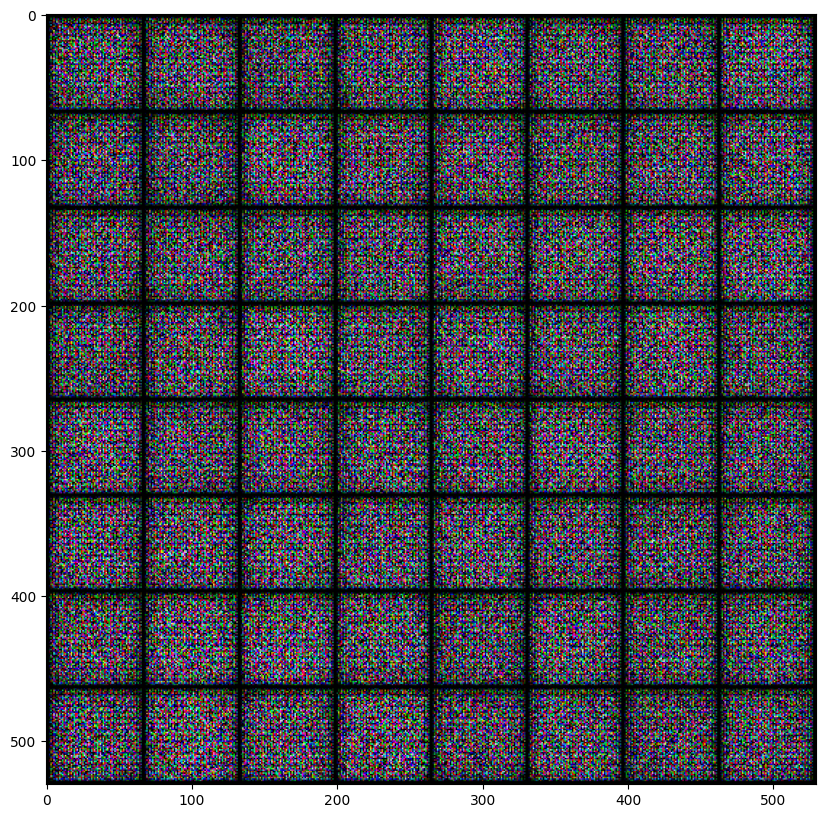

In [16]:
Noise_image = torch.randn(128,128,1,1).to(device)
print(Noise_image.shape)

fake_image =model_generator(Noise_image)
print(fake_image.shape)

plt.imshow(fake_image[0].permute(1,2,0).cpu().detach().numpy())
plt.show()

grid = make_grid(fake_image[:64], nrow = 8)
plt.figure(figsize=(10,10))
plt.imshow(grid.permute(1,2,0).cpu().detach().numpy())
plt.show()

# transposed_image = fake_image[0].permute(1,2,0)
# print(transposed_image.shape)
# plt.imshow(transposed_image.cpu().numpy())
# plt.show()

# Training


In [17]:
optimizer_discriminator = torch.optim.Adam(model_discriminator.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizer_generator = torch.optim.Adam(model_generator.parameters(), lr=2e-4, betas=(0.5, 0.999))

Loss_fn = nn.BCEWithLogitsLoss()

## a. Dicriminator Training

In [18]:
# def save_samples(epoch, model_generator, device):
#     noise = torch.randn(64, 128, 1, 1).to(device)
#     with torch.no_grad():
#         fake_imgs = model_generator(noise)
#         grid = make_grid((fake_imgs + 1) / 2, nrow=8)
#         plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
#         plt.title(f"Epoch {epoch}")
#         plt.axis("off")
#         plt.savefig(f"epoch_{epoch}.png")
#         plt.close()
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

def save_samples(epoch, model_generator, device):
    model_generator.eval()
    noise = torch.randn(64, 128, 1, 1).to(device)
    with torch.no_grad():
        fake_imgs = model_generator(noise)
        grid = make_grid((fake_imgs + 1) / 2, nrow=8)  # normalize to [0,1] if using Tanh

        # Plot and show
        plt.figure(figsize=(8, 8))
        plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
        plt.title(f"Epoch {epoch}")
        plt.axis("off")
        plt.tight_layout()
        plt.show()  # 👈 Shows the image in GUI-supported environments

        # Save image
        plt.imsave(f"epoch_{epoch}.png", grid.permute(1, 2, 0).cpu().numpy())
        print(f"✅ Image saved as epoch_{epoch}.png\n")


  0%|          | 0/5 [00:00<?, ?it/s]

EPOCHS: 0/5
-----
[0] Discriminator_loss: 1.4096, Generator_loss: 1.4188
[1] Discriminator_loss: 1.3001, Generator_loss: 2.5168
[2] Discriminator_loss: 0.4885, Generator_loss: 3.8797
[3] Discriminator_loss: 0.2433, Generator_loss: 4.3844
[4] Discriminator_loss: 0.2178, Generator_loss: 4.4812
[5] Discriminator_loss: 0.2334, Generator_loss: 4.8976
[6] Discriminator_loss: 0.1746, Generator_loss: 5.1750
[7] Discriminator_loss: 0.1742, Generator_loss: 5.5973
[8] Discriminator_loss: 0.1391, Generator_loss: 5.8603
[9] Discriminator_loss: 0.1775, Generator_loss: 5.8408
[10] Discriminator_loss: 0.1260, Generator_loss: 6.2421
[11] Discriminator_loss: 0.1342, Generator_loss: 6.5045
[12] Discriminator_loss: 0.0980, Generator_loss: 6.4414
[13] Discriminator_loss: 0.1001, Generator_loss: 5.9798
[14] Discriminator_loss: 0.1194, Generator_loss: 7.2412
[15] Discriminator_loss: 0.0821, Generator_loss: 6.7020
[16] Discriminator_loss: 0.1171, Generator_loss: 7.6862
[17] Discriminator_loss: 0.0745, Generat

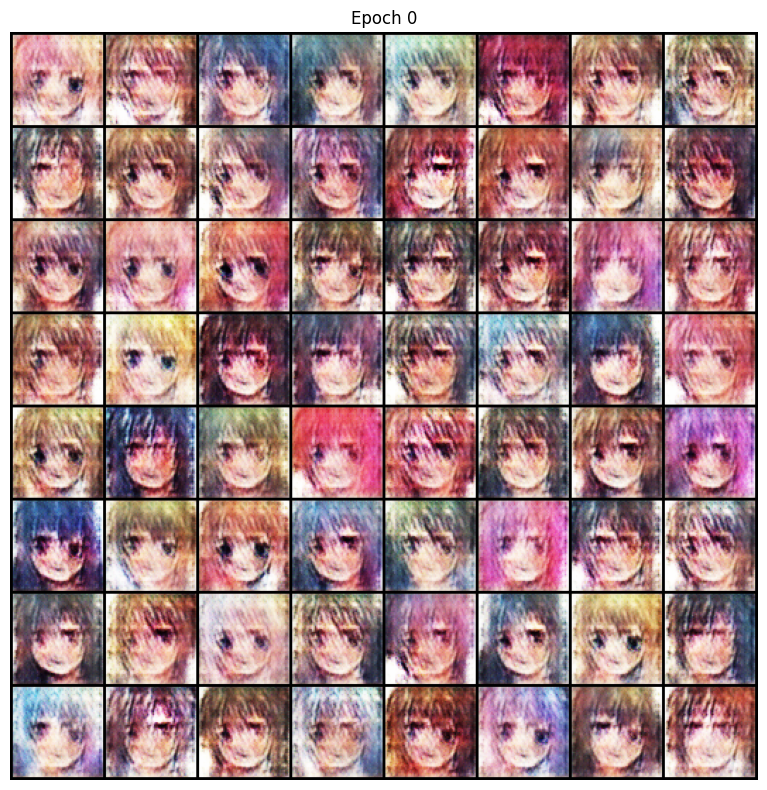

✅ Image saved as epoch_0.png

EPOCHS: 1/5
-----
[0] Discriminator_loss: 0.3461, Generator_loss: 4.8813
[1] Discriminator_loss: 0.3877, Generator_loss: 4.5877
[2] Discriminator_loss: 0.3617, Generator_loss: 4.9736
[3] Discriminator_loss: 0.6552, Generator_loss: 9.3399
[4] Discriminator_loss: 0.5984, Generator_loss: 7.2650
[5] Discriminator_loss: 0.1532, Generator_loss: 4.4767
[6] Discriminator_loss: 0.8121, Generator_loss: 9.8121
[7] Discriminator_loss: 0.9113, Generator_loss: 5.2999
[8] Discriminator_loss: 0.3712, Generator_loss: 5.4164
[9] Discriminator_loss: 0.3987, Generator_loss: 5.5209
[10] Discriminator_loss: 0.3966, Generator_loss: 5.3563
[11] Discriminator_loss: 0.3746, Generator_loss: 5.2655
[12] Discriminator_loss: 0.4973, Generator_loss: 7.1996
[13] Discriminator_loss: 0.6066, Generator_loss: 3.8975
[14] Discriminator_loss: 0.5421, Generator_loss: 7.7901
[15] Discriminator_loss: 0.4313, Generator_loss: 4.4062
[16] Discriminator_loss: 0.2358, Generator_loss: 4.4189
[17] Discr

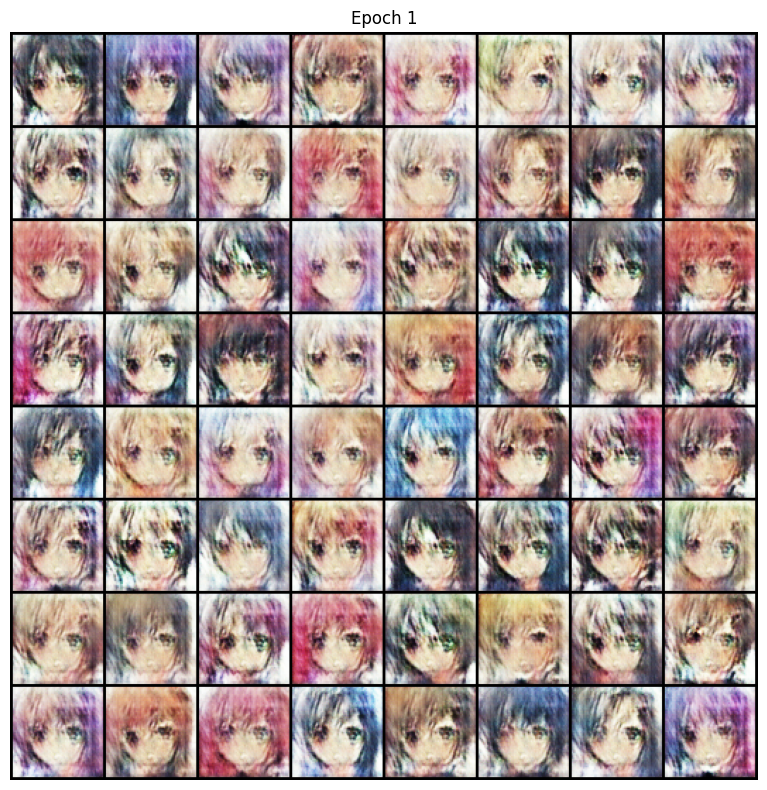

✅ Image saved as epoch_1.png

EPOCHS: 2/5
-----
[0] Discriminator_loss: 0.1558, Generator_loss: 4.9332
[1] Discriminator_loss: 0.4134, Generator_loss: 7.5953
[2] Discriminator_loss: 0.1863, Generator_loss: 6.8330
[3] Discriminator_loss: 0.3180, Generator_loss: 4.2885
[4] Discriminator_loss: 0.5952, Generator_loss: 8.8750
[5] Discriminator_loss: 0.6087, Generator_loss: 7.1942
[6] Discriminator_loss: 0.1510, Generator_loss: 4.1529
[7] Discriminator_loss: 0.6594, Generator_loss: 10.3088
[8] Discriminator_loss: 0.2256, Generator_loss: 10.3492
[9] Discriminator_loss: 0.3505, Generator_loss: 6.4984
[10] Discriminator_loss: 0.1395, Generator_loss: 4.3495
[11] Discriminator_loss: 0.7591, Generator_loss: 11.6972
[12] Discriminator_loss: 0.6850, Generator_loss: 9.5795
[13] Discriminator_loss: 0.2761, Generator_loss: 5.1250
[14] Discriminator_loss: 0.5463, Generator_loss: 9.0043
[15] Discriminator_loss: 0.1838, Generator_loss: 7.1570
[16] Discriminator_loss: 0.2300, Generator_loss: 4.2085
[17] Di

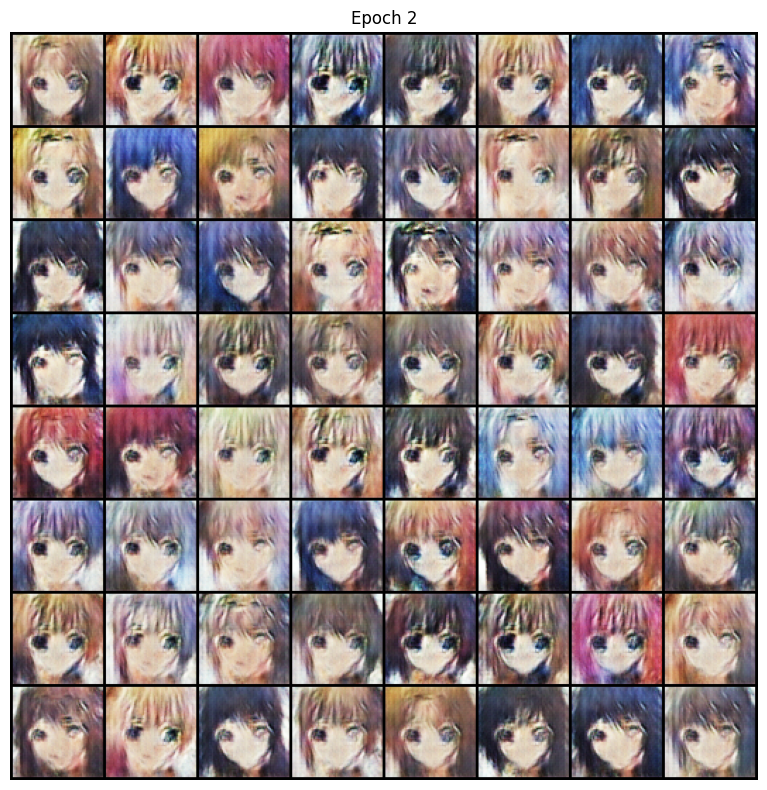

✅ Image saved as epoch_2.png

EPOCHS: 3/5
-----
[0] Discriminator_loss: 0.0737, Generator_loss: 5.3413
[1] Discriminator_loss: 0.1401, Generator_loss: 6.4868
[2] Discriminator_loss: 0.1460, Generator_loss: 4.5623
[3] Discriminator_loss: 0.2333, Generator_loss: 5.1744
[4] Discriminator_loss: 0.2118, Generator_loss: 5.5454
[5] Discriminator_loss: 0.1533, Generator_loss: 6.9035
[6] Discriminator_loss: 0.0939, Generator_loss: 6.0750
[7] Discriminator_loss: 0.0840, Generator_loss: 4.7297
[8] Discriminator_loss: 0.2268, Generator_loss: 6.9709
[9] Discriminator_loss: 0.1128, Generator_loss: 5.8620
[10] Discriminator_loss: 0.1558, Generator_loss: 4.7162
[11] Discriminator_loss: 0.2942, Generator_loss: 8.1595
[12] Discriminator_loss: 0.1588, Generator_loss: 6.8557
[13] Discriminator_loss: 0.1090, Generator_loss: 5.1395
[14] Discriminator_loss: 0.1423, Generator_loss: 4.7807
[15] Discriminator_loss: 0.2002, Generator_loss: 8.4048
[16] Discriminator_loss: 0.3591, Generator_loss: 5.3974
[17] Discr

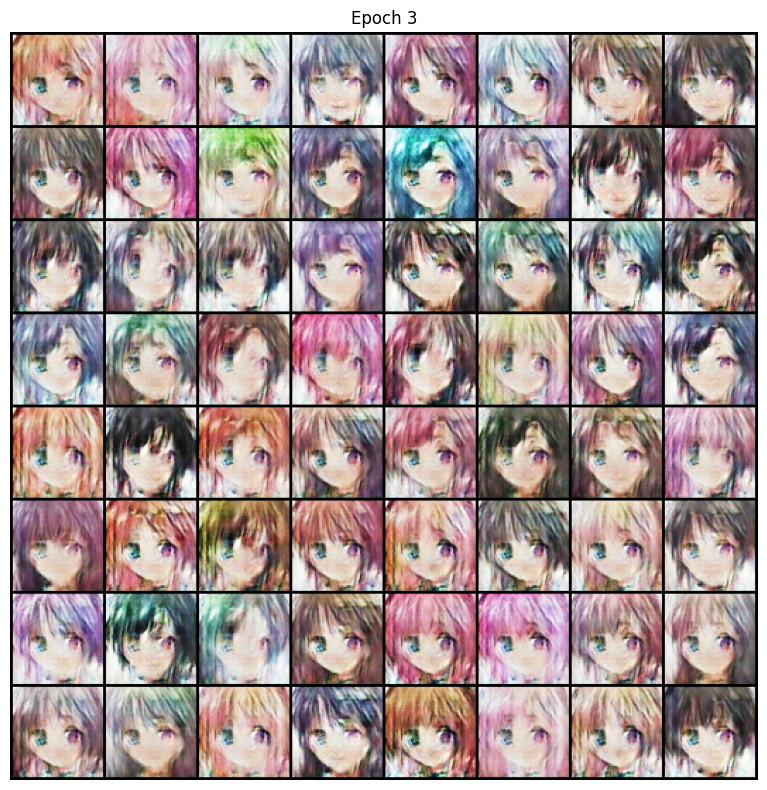

✅ Image saved as epoch_3.png

EPOCHS: 4/5
-----
[0] Discriminator_loss: 0.1111, Generator_loss: 7.6991
[1] Discriminator_loss: 0.1410, Generator_loss: 5.2527
[2] Discriminator_loss: 0.1857, Generator_loss: 8.5139
[3] Discriminator_loss: 0.0695, Generator_loss: 7.3148
[4] Discriminator_loss: 0.0545, Generator_loss: 5.8831
[5] Discriminator_loss: 0.1338, Generator_loss: 7.4715
[6] Discriminator_loss: 0.0860, Generator_loss: 5.9078
[7] Discriminator_loss: 0.1103, Generator_loss: 5.4044
[8] Discriminator_loss: 0.1511, Generator_loss: 6.7786
[9] Discriminator_loss: 0.0538, Generator_loss: 6.5915
[10] Discriminator_loss: 0.1065, Generator_loss: 5.2899
[11] Discriminator_loss: 0.1270, Generator_loss: 7.7516
[12] Discriminator_loss: 0.0905, Generator_loss: 7.0111
[13] Discriminator_loss: 0.0556, Generator_loss: 4.6630
[14] Discriminator_loss: 0.1836, Generator_loss: 10.5442
[15] Discriminator_loss: 0.3174, Generator_loss: 5.9925
[16] Discriminator_loss: 0.1057, Generator_loss: 6.7819
[17] Disc

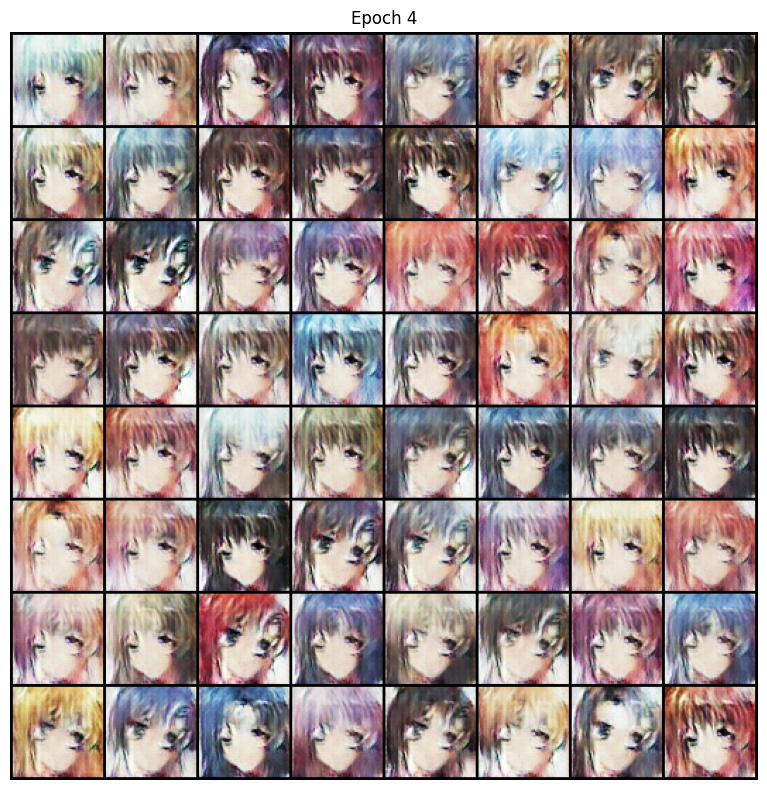

✅ Image saved as epoch_4.png



In [19]:
EPOCH = 5
REAL_LABEL = 1
FAKE_LABEL = 0

from tqdm.auto import tqdm


'''
>>> torch.full((2, 3), 3.141592)
tensor([[ 3.1416,  3.1416,  3.1416],
        [ 3.1416,  3.1416,  3.1416]])
'''
for epoch in tqdm(range(EPOCH)):
  print(f'EPOCHS: {epoch}/{EPOCH}\n-----')
  for batch, (real_image, _) in enumerate(train_loader):
    # we are taking data batch by batch
    real_image = real_image.to(device)

    ##### +++++++++ Train DIscriminator ++++##########

    # Passing Real Image through Discriminator
    model_discriminator.train()

    real_pred = model_discriminator(real_image)
    real_targets = torch.ones_like(real_pred)
    real_loss = Loss_fn(real_pred, real_targets)
    real_value = torch.mean(real_pred).item()

    # Generating Fake Images
    noise_image = torch.randn(real_image.size(0), 128, 1, 1).to(device)
    fake_image = model_generator(noise_image)

    # Passing Fake images to Discriminator
    fake_pred = model_discriminator(fake_image)
    fake_targets = torch.zeros_like(fake_pred)
    fake_loss = Loss_fn(fake_pred, fake_targets)
    fake_value = torch.mean(fake_pred).item()

    # Updating Discriminator Weights
    loss_discriminator = real_loss + fake_loss
    optimizer_discriminator.zero_grad()
    loss_discriminator.backward()
    optimizer_discriminator.step()

    ### +++++ Train Generator +++++ ####
    ## Generating Fake Images again
    noise_image = torch.randn(real_image.size(0), 128, 1, 1).to(device)
    fake_image = model_generator(noise_image)
    fake_pred = model_discriminator(fake_image)
    real_targets = torch.ones_like(fake_pred)
    loss_generator = Loss_fn(fake_pred, real_targets)

    optimizer_generator.zero_grad()
    loss_generator.backward()
    optimizer_generator.step()

    print(f"[{batch}] Discriminator_loss: {loss_discriminator:.4f}, Generator_loss: {loss_generator:.4f}")
  save_samples(epoch, model_generator, device)